In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display
%matplotlib inline

In [3]:
df = pd.read_csv(r'E:\diabetes_data.csv')

In [4]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [5]:
from ydata_profiling import ProfileReport

In [6]:
profile = ProfileReport(df)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

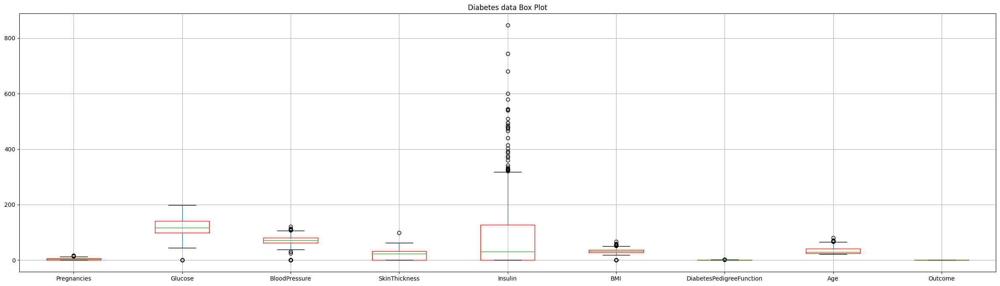

In [7]:
#identifying outliers using boxplot

df.boxplot(rot=0, boxprops = dict(color='red'), return_type='axes', figsize=(30,8))
plt.title("Diabetes data Box Plot")
plt.show()

In [8]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [9]:
df['Glucose'] = df['Glucose'].replace(0, df.Glucose.mean())
df['BloodPressure'] = df['BloodPressure'].replace(0, df.BloodPressure.mean())
df['SkinThickness'] = df['SkinThickness'].replace(0, df.SkinThickness.mean())
df['Insulin'] = df['Insulin'].replace(0, df.Insulin.mean())
df['BMI'] = df['BMI'].replace(0, df.BMI.mean())

In [10]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,121.681605,72.254807,26.606479,118.660163,32.450805,0.471876,33.240885,0.348958
std,3.369578,30.436016,12.115932,9.631241,93.080358,6.875374,0.331329,11.760232,0.476951
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200000,0.078000,21.000000,0.000000
25%,1.000000,99.750000,64.000000,20.536458,79.799479,27.500000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,79.799479,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [11]:
df[df.duplicated(subset=None, keep=False)]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome


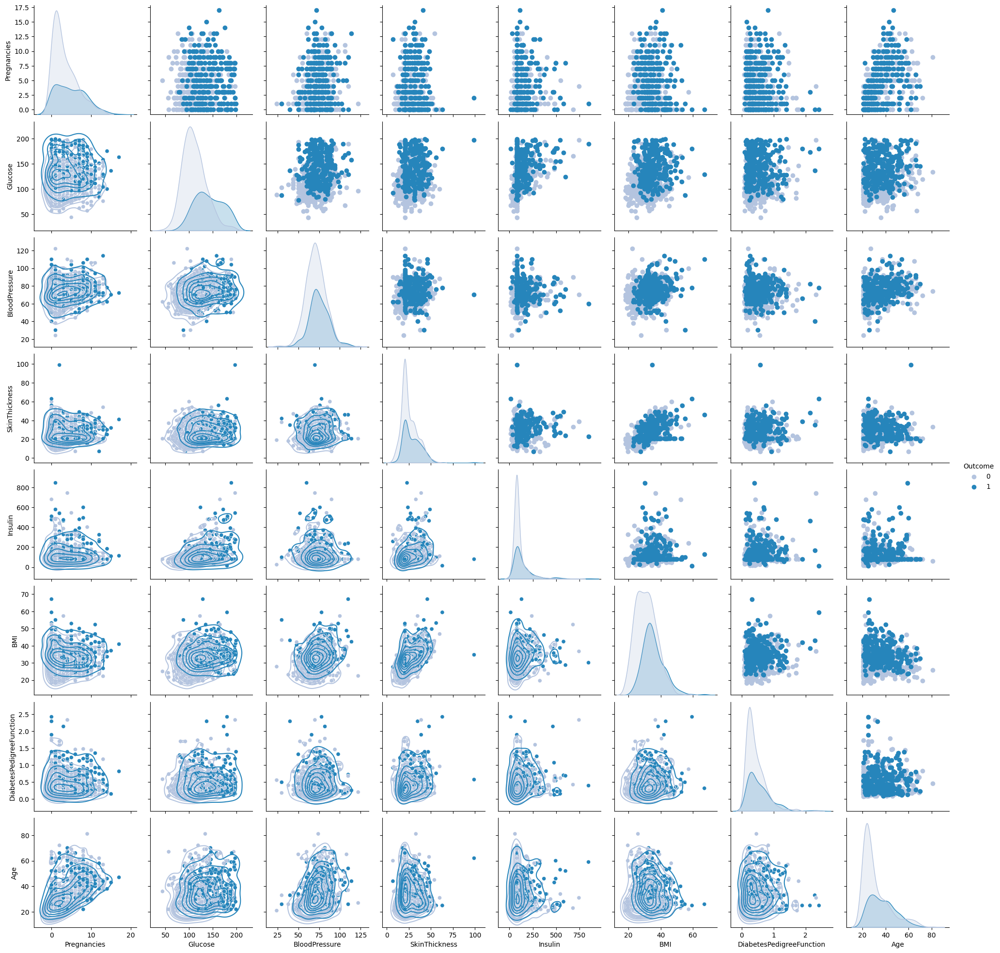

In [12]:
import seaborn as sns

sp = sns.pairplot(df, hue='Outcome', palette='PuBu')
sp = sp.map_upper(plt.scatter)
sp = sp.map_lower(sns.kdeplot)

In [17]:
from collections import Counter
count = Counter(df['Outcome'])
count.items()

dict_items([(1, 268), (0, 500)])

([<matplotlib.patches.Wedge at 0x2349493a150>,
 [Text(-0.5025943242672991, 0.9784676515931925, ''),
  Text(0.5254396165997799, -1.0229434047431347, '')],
 [Text(-0.27414235869125403, 0.5337096281417413, '65.1%'),
  Text(0.29698760938248425, -0.5781854026809021, '34.9%')])

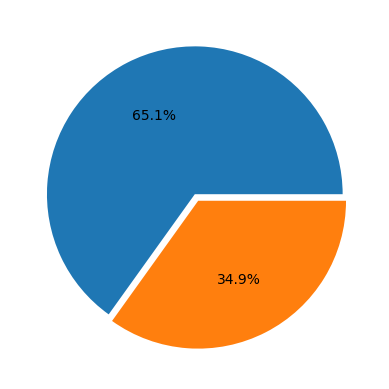

In [14]:
plt.pie(df['Outcome'].value_counts(), explode = (0, 0.05), autopct='%1.1f%%')

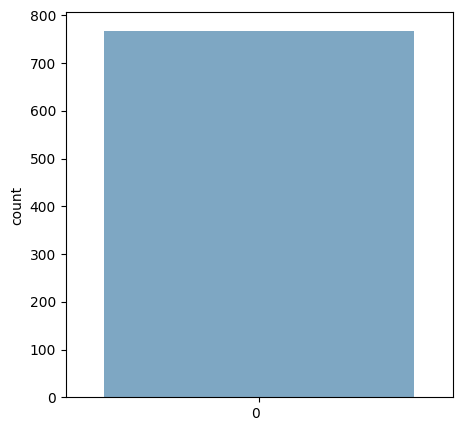

In [20]:
plt.figure(figsize = (5, 5))
ax = sns.countplot(df['Outcome'], palette = 'PuBu')
ax.set_xticklabels(ax.get_xticklabels(), rotation = 0, ha = "right")
plt.show()

#nevermind, this doesn't show the right viz, we'll ignore this

Text(0, 0.5, 'accuracy')

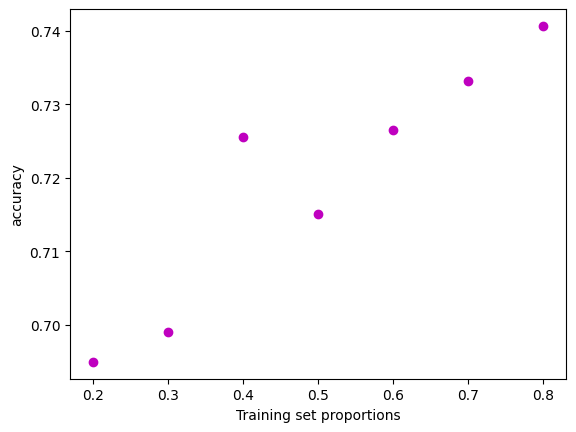

In [24]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
import math

df['Outcome'] = df.Outcome.astype(str)
df['Outcome'] = df.Outcome.astype(object)

X = df.iloc[:, :-1].values #attributes (features), selecting all rows (and columns too except the last one; Outcome)
Y = df.iloc[:, 8].values #labels (target variable), selecting all rows and the 9th column (Outcome)

t = [0.8, 0.7, 0.6, 0.5, 0.4, 0.3, 0.2] #training set proportions to be evaluated

DT = DecisionTreeClassifier(splitter='best', criterion='entropy', min_samples_leaf=2)
NB = GaussianNB()
KNN = KNeighborsClassifier(n_neighbors=math.ceil(math.sqrt(768)))

#find best training method
plt.figure()
for s in t:
    scores = []
    for i in range(1,1000):
        X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=1-s, random_state=987)
        DT.fit(X_train, Y_train)
        scores.append(DT.score(X_test, Y_test))
        NB.fit(X_train, Y_train)
        scores.append(NB.score(X_test, Y_test))
        KNN.fit(X_train, Y_train)
        scores.append(KNN.score(X_test, Y_test))
    plt.plot(s, np.mean(scores), 'mo')
plt.xlabel('Training set proportions')
plt.ylabel('accuracy')


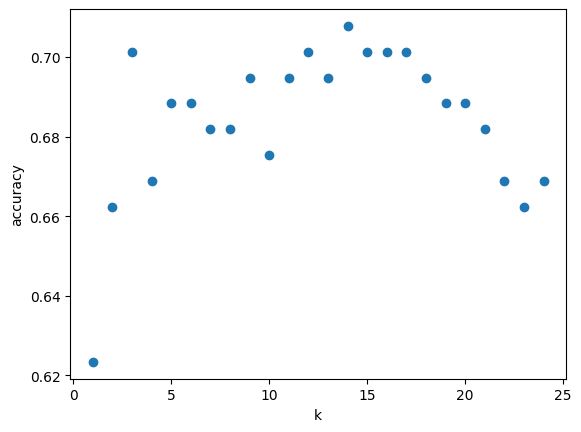

In [25]:
#KNN
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=987)

#find optimal no. of clusters
k_range = range(1,25)
scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, Y_train)
    scores.append(knn.score(X_test, Y_test))
plt.figure()
plt.xlabel('k')
plt.ylabel('accuracy')
plt.scatter(k_range, scores)
plt.xticks([0,5,10,15,20,25]);

In [26]:
len(X_train)

614

In [28]:
len(X_test)

154

In [29]:
count = Counter(Y_train)
print(count.items())

dict_items([('0', 408), ('1', 206)])


In [30]:
classifierKNN = KNeighborsClassifier(n_neighbors=15)
classifierKNN.fit(X_train, Y_train)

classifierKNN.effective_metric_

'euclidean'

In [31]:
classifierNB = GaussianNB()
classifierNB.fit(X_train, Y_train)

classifierNB.class_prior_

array([0.66449511, 0.33550489])

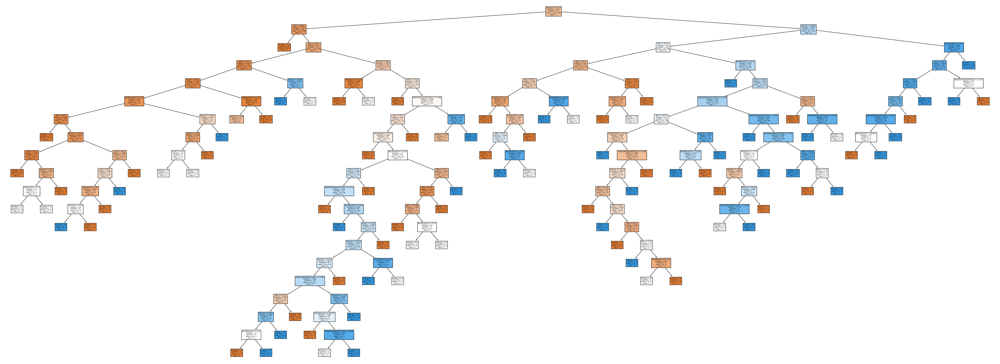

In [32]:
#DT
classifierDT = DecisionTreeClassifier(splitter='best', criterion='entropy',min_samples_leaf=2)
classifierDT.fit(X_train, Y_train)

#decision tree
from sklearn import tree
fig = plt.figure(figsize=(55,20))
fn = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']
DT = tree.plot_tree(classifierDT, feature_names=fn, class_names=Y, filled=True)

In [33]:
classifierDT.feature_importances_ #to identify important features

array([0.06438347, 0.31022773, 0.11293903, 0.01102262, 0.04382607,
       0.23111659, 0.08393706, 0.14254743])

In [34]:
len(X_test)

154

In [35]:
count = Counter(Y_test)
print(count.items())

dict_items([('0', 92), ('1', 62)])


In [36]:
Y_predKNN = classifierKNN.predict(X_test)
Y_predDT = classifierDT.predict(X_test)
Y_predNB = classifierNB.predict(X_test)

In [38]:
#using confusion matrix for knn model
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(Y_test, Y_predKNN))
print(classification_report(Y_test, Y_predKNN))

#accuracy performance
from sklearn.metrics import accuracy_score
print("train accuracy: ", accuracy_score(Y_train, classifierKNN.predict(X_train)))
print("test accuracy: ", accuracy_score(Y_test, Y_predKNN))

[[76 16]
 [30 32]]
              precision    recall  f1-score   support

           0       0.72      0.83      0.77        92
           1       0.67      0.52      0.58        62

    accuracy                           0.70       154
   macro avg       0.69      0.67      0.67       154
weighted avg       0.70      0.70      0.69       154

train accuracy:  0.7785016286644951
test accuracy:  0.7012987012987013


In [39]:
#using confusion matrix for nb model
print(confusion_matrix(Y_test, Y_predNB))
print(classification_report(Y_test, Y_predNB))

print("train accuracy: ", accuracy_score(Y_train, classifierNB.predict(X_train)))
print("test accuracy: ", accuracy_score(Y_test, Y_predNB))

[[76 16]
 [23 39]]
              precision    recall  f1-score   support

           0       0.77      0.83      0.80        92
           1       0.71      0.63      0.67        62

    accuracy                           0.75       154
   macro avg       0.74      0.73      0.73       154
weighted avg       0.74      0.75      0.74       154

train accuracy:  0.749185667752443
test accuracy:  0.7467532467532467


In [40]:
#using confusion matrix for dt
print(confusion_matrix(Y_test, Y_predDT))
print(classification_report(Y_test, Y_predDT))

print("train accuracy: ", accuracy_score(Y_train, classifierDT.predict(X_train)))
print("test accuracy: ", accuracy_score(Y_test, Y_predDT))

[[78 14]
 [21 41]]
              precision    recall  f1-score   support

           0       0.79      0.85      0.82        92
           1       0.75      0.66      0.70        62

    accuracy                           0.77       154
   macro avg       0.77      0.75      0.76       154
weighted avg       0.77      0.77      0.77       154

train accuracy:  0.9706840390879479
test accuracy:  0.7727272727272727


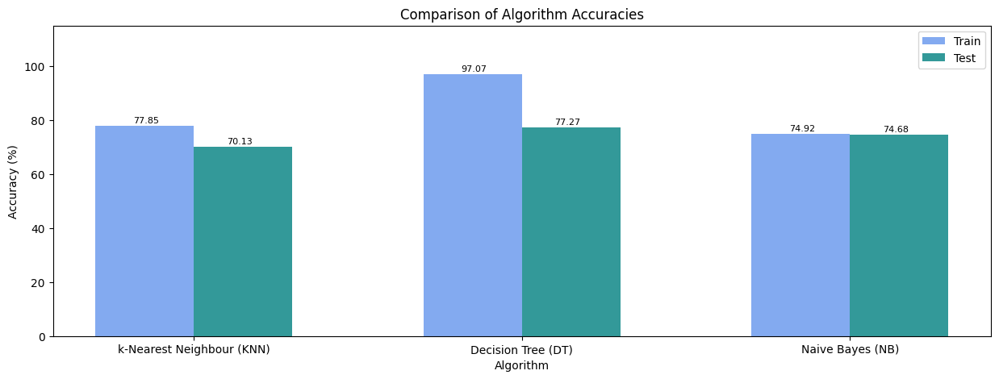

In [41]:
n_groups = 3
algorithms = ('k-Nearest Neighbour (KNN)', 'Decision Tree (DT)', 'Naive Bayes (NB)')
train_accuracy = (accuracy_score(Y_train, classifierKNN.predict(X_train))*100, 
                  accuracy_score(Y_train, classifierDT.predict(X_train))*100, 
                  accuracy_score(Y_train, classifierNB.predict(X_train))*100)
test_accuracy = (accuracy_score(Y_test, Y_predKNN)*100, 
                 accuracy_score(Y_test, Y_predDT)*100, 
                 accuracy_score(Y_test, Y_predNB)*100)

fig, ax = plt.subplots(figsize=(15, 5))
index = np.arange(n_groups)
bar_width = 0.3
opacity = 0.8
rects1 = plt.bar(index, train_accuracy, bar_width, alpha = opacity, color='Cornflowerblue', label='Train')
rects2 = plt.bar(index + bar_width, test_accuracy, bar_width, alpha = opacity, color='Teal', label='Test')
plt.xlabel('Algorithm') 
plt.ylabel('Accuracy (%)') 
plt.ylim(0, 115)
plt.title('Comparison of Algorithm Accuracies') 
plt.xticks(index + bar_width * 0.5, algorithms) 
plt.legend(loc = 'upper right')
for index, data in enumerate(train_accuracy):
    plt.text(x = index - 0.035, y = data + 1, s = round(data, 2), fontdict = dict(fontsize = 8))
for index, data in enumerate(test_accuracy):
    plt.text(x = index + 0.25, y = data + 1, s = round(data, 2), fontdict = dict(fontsize = 8))
plt.show()